In [2]:
import pandas as pd
import csv
import re
import numpy as np
import json


In [3]:
dt=pd.read_csv('BG_dt.csv')
rf=pd.read_csv('BG_rf.csv')
us=pd.read_csv('BG_usher.csv')

In [51]:
alias_dict = {}
with open('alias_key.json', "r") as read_file:
    alias_dict = json.load(read_file)
    if "A" in alias_dict:
        del alias_dict["A"]
    if "B" in alias_dict:
        del alias_dict["B"]
        
def expand_alias(pango_lineage, alias_dict):
    if not pango_lineage or pango_lineage in ["None", None, "","Unassigned"] or "/" in pango_lineage:
        return None

    lineage_parts = pango_lineage.split(".")
    if lineage_parts[0].startswith('X'):
        return pango_lineage
    while lineage_parts[0] in alias_dict.keys():
        if len(lineage_parts) > 1:
            pango_lineage = alias_dict[lineage_parts[0]] + "." + ".".join(lineage_parts[1:])
        else:
            pango_lineage = alias_dict[lineage_parts[0]]
        lineage_parts = pango_lineage.split(".")
    if lineage_parts[0] not in ["A","B"]:
        return None
    return pango_lineage

In [82]:
def compare(des, test):
    
    ds=des.split('.')
    ts=test.split('.')
    
    
    des_len=len(ds)
    test_len=len(ts)
    
    if test in ["None", None, "","Unassigned",'NaN'] or "/" in test:
        return ('Untested')
    if des in ["None", None, "","Unassigned",'NaN'] or "/" in test:
        return ('Untested')
    
    if test_len> des_len:
        if ts[0:(des_len)]==ds:
            return ('child')
        else:
            return("Unrelated")
        
    elif test_len< des_len:
        if ds[0:(test_len)]==ts:
                return ('ancestor')
        else:
            return("Unrelated")
        
    elif test_len==des_len:
        if ds==ts:
            return('Agree')
        elif ts[0:(test_len-1)]==ds[0:(des_len-1)]:
            return('horizontal')
        else:
            return("Unrelated")

In [108]:
compare('B.1.617.2.39.1.1','B.1.617.2.105')

'Unrelated'

In [83]:
with open ('gisaid_expand.csv','r') as file, open('gisaid_relation.csv', 'w') as csvfile:
    infile=csv.DictReader(file)
    title=infile.fieldnames
    title.extend(['RF_DT','RF_US','DT_US'])
    writer = csv.DictWriter(csvfile, fieldnames = title)
    writer.writeheader()
    
    for row in infile:
        dt=row['dt_expand']
        rf=row['rf_expand']
        us=row['usher_expand']
        
        row['RF_DT']=compare(rf,dt)
        row['RF_US']=compare(rf,us)
        row['DT_US']=compare(dt,us)
        writer.writerow(row)
        


In [9]:
relation=pd.read_csv('gisaid_relation.csv')
DT_US=relation.loc[(relation['dt_lineage']!=relation['usher_lineage'])&(relation['rf_lineage'].str.contains("BA"))]
RF_US=relation.loc[(relation['rf_lineage']!=relation['usher_lineage'])&(relation['rf_lineage'].str.contains("BA"))]
RF_DT=relation.loc[(relation['rf_lineage']!=relation['dt_lineage'])&(relation['rf_lineage'].str.contains("BA"))]


#DT_US.groupby([DT_US['DT_US']]).size()

```
Relationship in A_B as 'B compare to A': DT_US ancestor = US call ancestor of DT

DT_US
Unrelated      545
ancestor      7015
child         3820
horizontal    1532

RF_US
Unrelated       247
ancestor      12861
child          2814
horizontal      636

RF_DT
Unrelated      823
ancestor      9923
child         3074
horizontal    2202

FOR BA lineages only:

RF_US
ancestor    7914
child        456

RF_DT
Unrelated       4
ancestor     8578
child          18

DT_US
Unrelated       4
ancestor      128
child        1236


```
Where horizontal only account for 1st degree siblings 

Parallel include both parents and offspring relationships

We can see that most of the mismatched happens between parents and children lineages.


In [13]:
unrelatedt=relation.loc[(relation['RF_DT']=="Unrelated")]
#&(relation['RF_US']=='ancestor')
unrelatedt.groupby([unrelatedt['RF_US']]).size()

RF_US
Agree         328
Unrelated      68
ancestor      407
child           2
horizontal     18
dtype: int64

In the 823 sequences that Decision Tree assigned as lineages unrelated to the Random forest lineage, Usher tends to call them ancestor (407) in majority of the time compare to the random forest lineage. 

In [33]:
def ncount_distribution(infile,outfile):
    
    with open(infile,'r') as file,open(outfile,'w') as csvfile:
        title=['taxon','n_count']
        writer = csv.DictWriter(csvfile,fieldnames=title)
        writer.writeheader()
        updown_og=csv.DictReader(file)
        nsum={}
        for row in updown_og:
            ncount={row['query']:row['ambcount']}
            nsum.update(ncount)


        for key, value in nsum.items():
            keydict={'taxon':key, 'n_count':value}
            row=keydict
            writer.writerow(row)

In [34]:
ncount_distribution('big_gisaid.updown.csv','BG_ncount.csv')

In [4]:
dt2=dt[['taxon','lineage']].rename(columns={'lineage':'dt_lineage'})
rf2=rf[['taxon','lineage']].rename(columns={'lineage':'rf_lineage'})
us2=us[['taxon','lineage']].rename(columns={'lineage':'usher_lineage'})


In [5]:
a=pd.merge(dt2,rf2,how='outer',on=['taxon'])
bg=pd.merge(a,us2,how='outer',on=['taxon'])
print('decision tree != random forest :',len(bg.loc[bg['dt_lineage']!=bg['rf_lineage']]))
print('decision tree != usher :',len(bg.loc[bg['dt_lineage']!=bg['usher_lineage']]))
print('ramdom forest != usher :',len(bg.loc[bg['rf_lineage']!=bg['usher_lineage']]))
#print('All disagree :',len(bg.loc[(bg['dt_lineage']!=bg['usher_lineage']) &
                                 #(bg['rf_lineage']!=bg['usher_lineage'])]))


decision tree != random forest : 16022
decision tree != usher : 12912
ramdom forest != usher : 16558



decision tree != random forest : 16022 (8675 of them are in BA.1,following by delta)\
decision tree != usher : 12912 (1235 of them are in BA.1, following by delta)\
ramdom forest != usher : 16558 (7914 of them are in BA.1, following by delta and 456 sequences of BA.1)\
All disagree : 1770\
21861 sequences lead to overall disagreement.

Decision tree and USheR share more agreement, what happen in random forest can be BA.1


In [14]:
from matplotlib import pyplot as plt

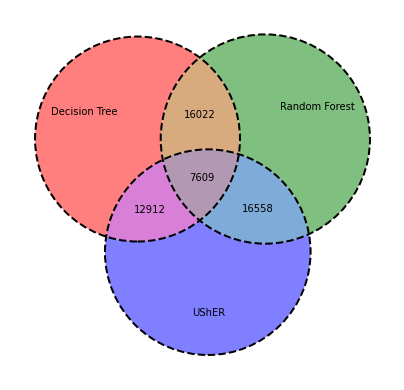

In [124]:
from matplotlib_venn import venn3, venn3_circles
plt.figure(figsize=(7,7))
v=venn3(subsets = (50000, 50000,16022,50000,12912,16558,7609),set_labels = ('', '', ''), alpha = 0.5)
v.get_label_by_id('100').set_text('Decision Tree')
v.get_label_by_id('010').set_text('Random Forest')
v.get_label_by_id('001').set_text('UShER')
c = venn3_circles(subsets = (50000, 50000,16022,50000,12912,16558,7609),linestyle='dashed')

In [75]:
bg.loc[bg['dt_lineage']=='BA.1.1']

,taxon,dt_lineage,rf_lineage,usher_lineage
986,USA/CA-CDC-FG-214095/2021,BA.1.1,BA.1.1,BA.1.1
987,USA/CA-CDC-FG-214089/2021,BA.1.1,BA.1.1,BA.1.1
993,USA/CA-CDC-FG-213670/2021,BA.1.1,BA.1.1,BA.1.1
995,USA/CA-CDC-FG-213516/2021,BA.1.1,BA.1.1,BA.1.1
1005,USA/CA-CDC-FG-213636/2021,BA.1.1,BA.1.1,BA.1.1
...,...,...,...,...
249308,USA/GA-CDC-MMB12196018/2021,BA.1.1,BA.1.1,BA.1.1
249471,Scotland/QEUH-2FCC2E7/2021,BA.1.1,BA.1.1,BA.1.1
249483,USA/OH-CDC-MMB12182326/2021,BA.1.1,BA.1.1,BA.1.1
249503,USA/OH-CDC-MMB12195355/2021,BA.1.1,BA.1.1,BA.1.1


In [6]:
bg_disagree=bg.loc[(bg['dt_lineage']!=bg['usher_lineage']) |
                                 (bg['rf_lineage']!=bg['usher_lineage'])|
                  (bg['dt_lineage']!=bg['usher_lineage'])]
bg1=bg.loc[bg['dt_lineage']!=bg['rf_lineage']]
bg2=bg.loc[bg['usher_lineage']!=bg['rf_lineage']]
bg3=bg.loc[bg['dt_lineage']!=bg['usher_lineage']]
bg_disagree.loc[(bg_disagree['rf_lineage'].str.contains('BA.2'))]
               #(bg_disagree['dt_lineage'].str.contains('BA.2'))|
               #(bg_disagree['usher_lineage'].str.contains('BA.2'))

,taxon,dt_lineage,rf_lineage,usher_lineage


According to Random forest:B.1.1.7 and AY.4 are the two most dominant lineage. (BA.1 only have 4460 results)\
According to Decision tree: the result is the same but BA.1 became way more in numbers. \
According to Usher: roughly the same as decision tree.

B.1.1.7 (Alpha)\
BA.1 (omicron)\
AY.4 (Delta)

## Sankey

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
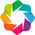

In [1]:
import holoviews as hv
hv.extension("bokeh")

In [99]:
basankey=hv.Sankey([['Random forest BA.1.1','Decision Tree BA.1',8574],
                    ['Decision Tree BA.1.1','Random forest BA.1',18],
                    ['Random forest BA.1.1','UShER BA.1',7904],
                    ['UShER BA.1.1','Random forest BA.1',456],
                    ['Decision Tree BA.1.1','UShER BA.1',125],
                    ['UShER BA.1.1','Decision Tree BA.1',1232]
                   ])
basankey.opts(width=800, height=800)

:Sankey   [start,end]   (Value)

#### Random Forest VS Decision Tree

In [47]:
rf_dt=bg1.groupby(by=['rf_lineage','dt_lineage']).size()
rf_dt=rf_dt.reset_index(name='count')
rf_dt['dt_lineage']='Desicion Tree '+rf_dt['dt_lineage']
rf_dt['rf_lineage']='Random Forest '+rf_dt['rf_lineage']
rf_dt_clean=rf_dt.loc[rf_dt['count']>=20]
rf_dt_clean

,rf_lineage,dt_lineage,count
29,Random Forest AY.100,Desicion Tree AY.3.1,20
37,Random Forest AY.100,Desicion Tree B.1.617.2,38
59,Random Forest AY.102,Desicion Tree AY.4.2.3,22
71,Random Forest AY.103,Desicion Tree AY.100,32
243,Random Forest AY.118,Desicion Tree B.1.617.2,21
...,...,...,...
1647,Random Forest B.1.617.2,Desicion Tree AY.43,39
1649,Random Forest B.1.617.2,Desicion Tree AY.44,26
1670,Random Forest B.1.617.2,Desicion Tree AY.61,109
1690,Random Forest B.1.617.2,Desicion Tree AY.9.2,89


In [158]:
rf_dt_sankey=hv.Sankey(rf_dt_clean)
rf_dt_sankey.opts(width=1000, height=1000,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='8pt')

:Sankey   [rf_lineage,dt_lineage]   (count)

8574 disagreement between Random forest assigned BA.1.1 and Desicion Tree assigned BA.1

### Random Forest VS UShER

In [28]:
rf_us=bg2.groupby(by=['rf_lineage','usher_lineage']).size()
rf_us=rf_us.reset_index(name='count')
rf_us['usher_lineage']='UShER '+rf_us['usher_lineage']
rf_us['rf_lineage']='Random Forest '+rf_us['rf_lineage']
rf_us_clean=rf_us.loc[rf_us['count']>=15]
rf_us_clean

,rf_lineage,usher_lineage,count
16,Random Forest AY.100,UShER AY.3.1,21
21,Random Forest AY.100,UShER B.1.617.2,93
36,Random Forest AY.102,UShER B.1.617.2,460
51,Random Forest AY.103,UShER B.1.617.2,76
58,Random Forest AY.107,UShER B.1.617.2,19
...,...,...,...
995,Random Forest BA.1.1,UShER BA.1,7904
998,Random Forest C.36,UShER C.17,31
1006,Random Forest P.1,UShER P.1.12,36
1021,Random Forest Q.1,UShER B.1.1.7,68


In [159]:
rf_us_sankey=hv.Sankey(rf_us_clean)
rf_us_sankey.opts(width=1000, height=1000,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='8pt')

:Sankey   [rf_lineage,usher_lineage]   (count)


7904 disagreement between Random forest assigned BA.1.1 and Desicion Tree assigned BA.1

Also some disagreement between AYs and B.1.617.2

### Decision Tree VS UShER


In [7]:
dt_us=bg3.groupby(by=['dt_lineage','usher_lineage']).size()
dt_us=dt_us.reset_index(name='count')
dt_us['usher_lineage']='UShER '+dt_us['usher_lineage']
dt_us['dt_lineage']='Desicion Tree '+dt_us['dt_lineage']
dt_us_clean=dt_us.loc[dt_us['count']>=15]
dt_us_clean

,dt_lineage,usher_lineage,count
21,Desicion Tree AY.10,UShER B.1.617.2,15
23,Desicion Tree AY.100,UShER AY.103,32
41,Desicion Tree AY.100,UShER B.1.617.2,72
60,Desicion Tree AY.102,UShER B.1.617.2,502
73,Desicion Tree AY.103,UShER B.1.617.2,144
...,...,...,...
1633,Desicion Tree P.1,UShER P.1.12,34
1647,Desicion Tree P.1.12,UShER P.1,25
1658,Desicion Tree Q.1,UShER B.1.1.7,213
1661,Desicion Tree Q.4,UShER B.1.1.7,19


In [11]:
dt_us_sankey=hv.Sankey(dt_us)
dt_us_sankey.opts(width=900, height=1000,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='8pt',edge_alpha=0.2)

:Sankey   [dt_lineage,usher_lineage]   (count)

Between decision tree and usher, the disagreements have mainly happened within the delta sequences. but we can still see a significant part of the disagreement between Usher assigned BA.1.1 and Desicion Tree assigned BA.1

In [38]:
dt_us2=dt_us.set_axis(['source','des','count'],axis=1)
rf_dt2=rf_dt.set_axis(['source','des','count'],axis=1)
rf_us2=rf_us.set_axis(['source','des','count'],axis=1)

big_san=pd.concat([dt_us2,rf_us2,rf_dt2],ignore_index=True, sort=False)
big_san_cl=big_san.loc[big_san['count']>=50]

In [50]:
big_sankey=hv.Sankey(big_san_cl)
big_sankey.opts(width=1000, height=1400,node_sort=True,node_alpha=1.0,edge_color="grey",edge_line_width=1,
                        label_position='outer', node_width=20,label_text_font_size='8pt')

:Sankey   [source,des]   (count)

In [25]:
#ncount=pd.read_csv('BG_ncount.csv')
#n2=pd.DataFrame(np.vstack([ncount.columns, ncount])).rename(columns={'0':'taxon','1':'ncount'})
#n2.rename(columns={0:'taxon',1:'ncount'},inplace=True)
#n2
bg2=pd.merge(bg,n2,how='left',on=['taxon'])
#bg2.to_csv('gisaid_big_sum.csv')

In [72]:
with open ('gisaid_big_sum.csv','r') as file, open('gisaid_expand.csv', 'w') as csvfile:
    BG_expand=csv.DictReader(file)
    
    title = BG_expand.fieldnames
    title.extend(['dt_expand','rf_expand','usher_expand'])
    writer = csv.DictWriter(csvfile, fieldnames = title)
    writer.writeheader()
    
    for row in BG_expand:
        dt=row['dt_lineage']
        rf=row['rf_lineage']
        usher=row['usher_lineage']
        
        row['dt_expand']=expand_alias(dt, alias_dict)     
        row['rf_expand']=expand_alias(rf, alias_dict) 
        row['usher_expand']=expand_alias(usher, alias_dict)     
        writer.writerow(row)

In [15]:
from random import sample 
from scipy import stats

In [15]:
nolist=bg2.loc[bg2['agree']=='no','ncount'].tolist()
yeslist=bg2.loc[bg2['agree']=='yes','ncount'].tolist()


yessample=sample(yeslist,21861)
print(stats.ttest_ind(nolist, yessample, equal_var = False))

Ttest_indResult(statistic=13.836965501545862, pvalue=1.4931213843925928e-41)


In [35]:
num=100
for _ in range(num):
    yessample=sample(yeslist,490)
    print(stats.ttest_ind(nolist, yessample, equal_var = False))

Ttest_indResult(statistic=8.78302428672814, pvalue=5.422684358891449e-18)
Ttest_indResult(statistic=7.565846009219667, pvalue=8.035245345243986e-14)
Ttest_indResult(statistic=8.553998342015852, pvalue=3.956502403692458e-17)
Ttest_indResult(statistic=8.115653011343412, pvalue=1.2369431284790596e-15)
Ttest_indResult(statistic=7.599475814765813, pvalue=6.361049287010053e-14)
Ttest_indResult(statistic=9.215776766635864, pvalue=1.3287979321641722e-19)
Ttest_indResult(statistic=10.971210932038062, pvalue=6.4491552651737955e-27)
Ttest_indResult(statistic=7.590909528516737, pvalue=6.482638532206121e-14)
Ttest_indResult(statistic=7.729247589171271, pvalue=2.4150167931480446e-14)
Ttest_indResult(statistic=7.546873257984857, pvalue=9.279766972298974e-14)
Ttest_indResult(statistic=8.596519594014035, pvalue=2.5183036566486942e-17)
Ttest_indResult(statistic=8.37760142271626, pvalue=1.5629501313439857e-16)
Ttest_indResult(statistic=8.305233039368064, pvalue=2.87715134566347e-16)
Ttest_indResult(stati

In [18]:
print(len(nolist))
print(len(yeslist))

1770
248230


T test results range: pvalue=6.4491552651737955e-27/ pvalue=2.3708227722604994e-08


## N content to time

In [176]:
time=pd.read_csv('designated_summary.csv')
earlytime=time[['lineage','earliest_date']]


rf_n=bg2[['rf_lineage','agree','taxon']].groupby(['rf_lineage','agree']).count().unstack(level=1)
rf_n1=rf_n.apply(lambda x: x/x.sum(), axis=1).reset_index()
rf_n2=rf_n1[[('rf_lineage', ''),('taxon', 'yes')]].set_axis(['lineage','agree%'],axis=1)
rf_nsum=pd.merge(rf_n2,earlytime,how='left',on=['lineage'])
rf_nsum.to_csv('rf_N.csv')

In [178]:
dt_n=bg2[['dt_lineage','agree','taxon']].groupby(['dt_lineage','agree']).count().unstack(level=1)
dt_n1=dt_n.apply(lambda x: x/x.sum(), axis=1).reset_index()
dt_n2=dt_n1[[('dt_lineage', ''),('taxon', 'yes')]].set_axis(['lineage','agree'],axis=1)
dt_nsum=pd.merge(dt_n2,earlytime,how='left',on=['lineage'])
#dt_nsum.to_csv('dt_N.csv')
dt_nsum

,lineage,agree,earliest_date
0,A,0.961905,2019-12-30
1,A.1,1.000000,2020-02-22
2,A.11,1.000000,2020-03-20
3,A.12,1.000000,2020-04-10
4,A.15,1.000000,2020-04-20
...,...,...,...
1417,XA,1.000000,2021-01-30
1418,XB,0.990000,2021-01-26
1419,XC,1.000000,2021-08-12
1420,Y.1,1.000000,2020-11-03


## BA.1 & BA.1.1

Looking for mutation G22599A (S:R346K)

Try to find the different mutation on the location, how many of them are 346K, 346R or 346N

In [81]:
print("DT BA.1.1", len(bg_disagree.loc[bg_disagree['dt_lineage']=="BA.1.1"]))
print("RF BA.1.1", len(bg_disagree.loc[bg_disagree['rf_lineage']=="BA.1.1"]))
print("US BA.1.1", len(bg_disagree.loc[bg_disagree['usher_lineage']=="BA.1.1"]))
print("DT BA.1", len(bg_disagree.loc[bg_disagree['dt_lineage']=="BA.1"]))
print("RF BA.1", len(bg_disagree.loc[bg_disagree['rf_lineage']=="BA.1"]))
print("US BA.1", len(bg_disagree.loc[bg_disagree['usher_lineage']=="BA.1"]))

DT BA.1.1 140
RF BA.1.1 8704
US BA.1.1 1246
DT BA.1 9017
RF BA.1 460
US BA.1 7909


DT BA.1.1: 140\
RF BA.1.1: 8704\
US BA.1.1: 1246\
DT BA.1: 9017\
RF BA.1: 460\
US BA.1: 7909

In [37]:
bgsum=pd.read_csv('gisaid_big_sum.csv')
len(bgsum.loc[bgsum['ncount']>=2600])

7

### The "BAD" BA lineage

In the 9164 sequence we subsampled, marjority of them are the mismatches between BA.1 and BA.1.l of the 3 methods.

However, there are some mismatches that are not. 

Decision tree had 8 random lineages assignment to the sequences that Random forest call BA.1.1. 

Usher had 8 B.1.529 (the basal lineage of BA/omicron) lineages assignment to the sequences that Random forest call BA.1.1.

This can be the evidence showing the behaviour of decision tree and usher when they are encountering sequences that are difficult to assign.


In [69]:
ba_list=bgsum['taxon'].loc[(bgsum['agree']=='no') & (bgsum['rf_lineage'].str.contains('BA.1'))].tolist()
len(ba_list)

9164

In [117]:
ba1df=bgsum.loc[(bgsum['agree']=='no') & (bgsum['rf_lineage'].str.contains('BA.1'))]
#ba1df.groupby(by=['rf_lineage','usher_lineage','dt_lineage']).size()
badba=ba1df['taxon'].loc[(ba1df['usher_lineage']!='BA.1')&(ba1df['usher_lineage']!='BA.1.1')].tolist()
badba

['USA/WA-CDC-UW21121895977/2021',
 'USA/UT-UPHL-220107438957/2021',
 'USA/TX-CDC-ASC210558030/2021',
 'Switzerland/SO-ETHZ-35244662/2021',
 'Morocco/IPM20386910/2021',
 'Czech_Republic/CSQ4558/2022',
 'USA/CA-CDC-ASC210570168/2021',
 'USA/SD-CDC-ASC210575299/2021',
 'USA/KS-KHEL-8372/2021',
 'USA/OH-CDC-ASC210572593/2021']

In [152]:
with open('BA_updown.csv','r') as file:
    updown_og=csv.DictReader(file)
    baddict_list=[]
    for row in updown_og:
        if row['query'] in badba:
            mrange=row['SNPs']
            msplit=re.split(r'\|',mrange)

            for item in msplit:
                listsnp= re.split('([ATCG])',item)
                mutationdic={'loc':listsnp[2],'reference':listsnp[1],'snp':listsnp[3]}
            
                baddict_list.append(mutationdic)
baddf=pd.DataFrame(baddict_list)
badBAsnpcount=baddf.groupby(baddf['loc']).size().to_frame()
badBAsnpcount
print(badBAsnpcount[badBAsnpcount[0]<9164].sort_values(by=0,ascending=False).head(50))
#badBAsnpcount.to_csv('badBA_snp.csv')


        0
loc      
10029  10
8782   10
28144  10
23604  10
14408  10
21846   9
23403   9
24469   9
25000   8
24503   8
10449   8
23599   8
21762   8
25584   8
28271   8
28311   7
24424   7
3037    7
13195   7
24130   6
23525   6
26270   6
28881   6
15240   6
8393    6
5386    5
2832    5
11537   5
22917   5
22995   5
27259   5
27807   4
27874   4
23202   4
28883   4
28882   4
4181    3
23854   3
23948   3
26767   3
26709   3
18163   3
26577   3
26530   3
22578   3
27638   2
28461   2
7124    2
15451   2
16466   2


In [131]:
with open('BA_updown.csv','r') as file:
    updown_og=csv.DictReader(file)
    
    nlocationsum=[]
    
    for row in updown_og:
        if row['query'] in badba:
            nrange=row['ambiguities']
            nsplit=re.split(r'\|',nrange)
        
            for exrange in nsplit:
                rsplit=list(map(int,re.split(r'\-',exrange)))
                nlocation=rangesplit(rsplit[0],rsplit[-1])
                nlocationsum.extend(nlocation)
            
        ndict=Counter(nlocationsum) 
        ndict=dict(ndict)

        


ValueError: If using all scalar values, you must pass an index

In [1]:
BADba_n=pd.read_csv('bad_BA_n.csv')
#print(BADba_n.loc[BADba_n['ncount']<10].sort_values(by='ncount',ascending=False).head(50))

NameError: name 'pd' is not defined

In [22]:
with open ('big_gisaid.updown.csv','r') as file, open('BA_updown.csv','w') as csvfile:
    ba=csv.DictReader(file)
    title=ba.fieldnames
    writer = csv.DictWriter(csvfile, fieldnames = title)
    writer.writeheader()
    for row in ba:
        if str(row['query']) in ba_list:
            writer.writerow(row)
            

#### import function to process updown file

In [26]:
def w_snp_graph(infile):
    with open(infile,'r') as file:
        updown_og=csv.DictReader(file)

        mdict_list=[]

        for row in updown_og:
            mrange=row['SNPs']
            msplit=re.split(r'\|',mrange)

            for item in msplit:
                listsnp= re.split('([ATCG])',item)
                mutationdic={'loc':listsnp[2],'reference':listsnp[1],'snp':listsnp[3]}
                mdict_list.append(mutationdic)
            
    #import pandas as pd

    snpdf=pd.DataFrame(mdict_list)
    return(snpdf)

In [40]:
def w_ncount_graph(infile):
    with open(infile,'r') as file:
        updown_og=csv.DictReader(file)

        nlocationsum=[]

        for row in updown_og:
            nrange=row['ambiguities']
            nsplit=re.split(r'\|',nrange)

            for exrange in nsplit:
                rsplit=list(map(int,re.split(r'\-',exrange)))
                nlocation=rangesplit(rsplit[0],rsplit[-1])
                nlocationsum.extend(nlocation)

        ndict=Counter(nlocationsum) 
        ndict=dict(ndict)
        ncountdf=pd.DataFrame(ndict)
    return(ncountdf)

In [17]:
def rangesplit(a,b):
    rangelist=list(range(a,b+1))
    return rangelist
from collections import Counter

In [15]:
def w_ncount_graph(infile,outfile):
    
    with open(infile,'r') as file:
        updown_og=csv.DictReader(file)
    
        nlocationsum=[]
    
        for row in updown_og:
            nrange=row['ambiguities']
            nsplit=re.split(r'\|',nrange)
        
            for exrange in nsplit:
                rsplit=list(map(int,re.split(r'\-',exrange)))
                nlocation=rangesplit(rsplit[0],rsplit[-1])
                nlocationsum.extend(nlocation)
            
        ndict=Counter(nlocationsum) 
        ndict=dict(ndict)
    
    with open(outfile, 'w') as csvfile:
        title=['location','ncount']
        writer = csv.DictWriter(csvfile, fieldnames = title)
        writer.writeheader()
        for key, value in ndict.items():
            keydict={'location':key, 'ncount':value}
            row=keydict
            writer.writerow(row)
        

In [48]:
w_ncount_graph('BA_updown.csv','BA_ncount.csv')


In [68]:
ba_snp=w_snp_graph('BA_updown.csv')
print(ba_snp['snp'].loc[ba_snp['loc']=='26530'])

46        G
104       G
159       G
216       G
272       G
         ..
483971    G
484027    G
484082    G
484127    G
484180    G
Name: snp, Length: 8430, dtype: object


In [75]:
ba_n=pd.read_csv('BA_ncount.csv')
print(ba_n.loc[ba_n['ncount']<9164].sort_values(by='ncount',ascending=False).head(50))

     location  ncount
273     11287    9135
503     28366    9133
504     28367    9133
505     28368    9132
274     11288    9132
275     11289    9131
265      6513    9128
266      6514    9127
267      6515    9125
502     28365    9124
506     28369    9123
286     21989    9123
276     11290    9122
285     21988    9121
290     21993    9117
289     21992    9117
291     21994    9113
277     11291    9112
284     21987    9112
287     21990    9112
280     21767    9110
500     28363    9110
507     28370    9109
292     21995    9109
501     28364    9109
288     21991    9108
281     21768    9103
279     21766    9103
282     21769    9103
283     21770    9101
272     11286    9087
271     11285    9084
278     21765    9083
270     11284    9047
269     11283    9046
499     28362    9039
295     22196    8841
294     22195    8836
293     22194    8835
392     22882    6626
391     22881    6592
443     22933    6592
442     22932    6590
390     22880    6589
444     22

137 G22599A\
965 G22599N  pull out a list of sequence with this N for Aine

557 C2470T\
62  C2470N

6626 T22882N\
2164 T22882G

538 A26530N\
8430 A26530G

#### over 9000 N locations:

ORF1a 3674  (Loc:11287)\
ORF9b 28    (Loc:28366-28368)\




# To do:

Certainly look into the homoplasy influence on the the assignment.
For the reference, can be more the lineage specific, problem sites, the machien learning specific.

1. try to find whether the sequence with 22882N have distinguiable 22599 sites that are actually able to be defined as one of the BA lineages (find out the overlapping). Because the reservion back to reference or N on the 22882 site might be a signing of either recombination or amplicon drop out. Both of which might lead to the unexpected mutation or N at the defining mutation site 22599.

2. the Sankey between BA.1.1 and BA.1

3. rewrite the relationship csv to parent and child, conclude the directionality of the mismatch using a group bar chart.



#### The N content location of BA1.1 that is correctly assigned by all 3 methods.

In [29]:
bg2['agree']=np.where((bg2['dt_lineage']!=bg2['usher_lineage']) | 
                      (bg2['dt_lineage']!=bg2['rf_lineage']) |
                      (bg2['usher_lineage']!=bg2['rf_lineage']), 'no','yes')
#ba_correct=bg2['taxon'].loc[(bg2['agree'].str.contains('yes'))&
       #(bg2['rf_lineage'].str.contains('BA.1.1'))].tolist()


In [31]:
bg2.to_csv('gisaid_big_sum.csv')

In [13]:
with open ('big_gisaid.updown.csv','r') as file, open('BA_correct.csv','w') as csvfile:
    ba=csv.DictReader(file)
    title=ba.fieldnames
    writer = csv.DictWriter(csvfile, fieldnames = title)
    writer.writeheader()
    for row in ba:
        if str(row['query']) in ba_correct:
            writer.writerow(row)

In [18]:
w_ncount_graph('BA_correct.csv','BA__correct_ncount.csv')

In [28]:
ba_correct_n=pd.read_csv('BA__correct_ncount.csv')

ba_correct_n.loc[ba_correct_n['location']==22882]

,location,ncount
1203,22882,1889


In [58]:
with open('BA_updown.csv','r') as file:
    updown_og=csv.DictReader(file)
    s440list=[]
    n=0
    for row in updown_og:
        nrange=row['ambiguities']
        nsplit=re.split(r'\|',nrange)
        
        for exrange in nsplit:
            rsplit=list(map(int,re.split(r'\-',exrange)))
            nlocation=rangesplit(rsplit[0],rsplit[-1])
            if 22882 in nlocation:
                n+=1
                s440list.append(row['query'])
                
   
            

   
  

In [72]:
with open('BA_updown.csv','r') as file:
    updown_og=csv.DictReader(file)
    mdict_list=[]

    for row in updown_og:
        if row['query']in s440list:
            mrange=row['SNPs']
            msplit=re.split(r'\|',mrange)

            for item in msplit:
                listsnp= re.split('([ATCG])',item)
                mutationdic={'loc':listsnp[2],'reference':listsnp[1],'snp':listsnp[3]}
            
                mdict_list.append(mutationdic)
snp440df=pd.DataFrame(mdict_list)
snp440df
len(snp440df.loc[snp440df['loc']=="22599"])

31

965 sequences contains both 22882 and 22599 N.\
If 22882 N, only 31 of the sequences show defining mutation for BA.1.1


## BA disagree Compare to the rest of disagree

In [16]:
ba_n=bgsum['ncount'].loc[(bgsum['rf_lineage'].str.contains('BA.1'))&(bgsum['agree']=='no')].tolist()
rest_n=bgsum['ncount'].loc[(-bgsum['rf_lineage'].str.contains('BA.1'))&(bgsum['agree']=='no')].tolist()
stats.ttest_ind(ba_n, rest_n, equal_var = False)

Ttest_indResult(statistic=43.66028335967605, pvalue=0.0)

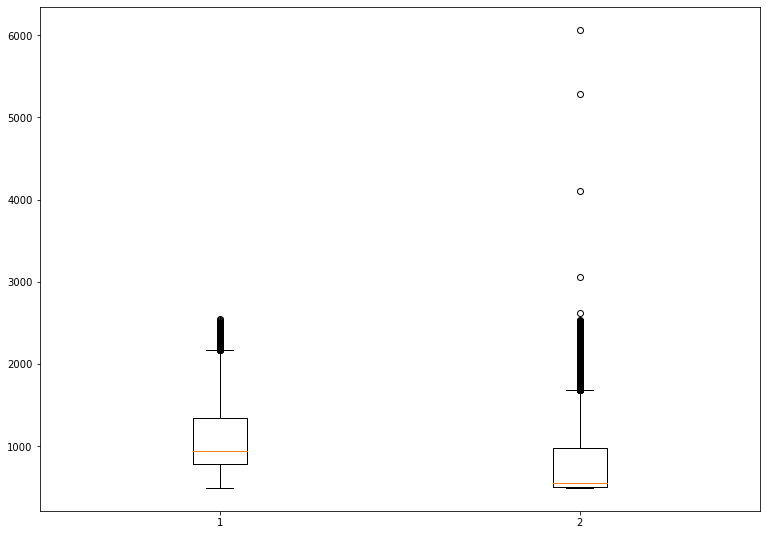

In [21]:
import matplotlib.pyplot as plt
data=[ba_n,rest_n]
fig = plt.figure(figsize =(10, 7))
 
# Creating axes instance
ax = fig.add_axes([0, 0, 1, 1])
 
# Creating plot
bp = ax.boxplot(data)
 
# show plot
plt.show()

## The behaviour study

In [23]:
relation=pd.read_csv('gisaid_relation.csv')
relation

,Unnamed: 0,taxon,dt_lineage,rf_lineage,usher_lineage,ncount,dt_expand,rf_expand,usher_expand,RF_DT,RF_US,DT_US
0,0,Wales/PHWC-PYIGZG/2021,AY.4,AY.4,AY.4,734,B.1.617.2.4,B.1.617.2.4,B.1.617.2.4,Agree,Agree,Agree
1,1,England/PHWC-PYIHJP/2021,AY.4,AY.4,AY.4,781,B.1.617.2.4,B.1.617.2.4,B.1.617.2.4,Agree,Agree,Agree
2,2,England/PHWC-PYII8A/2021,AY.5,AY.5,AY.5,533,B.1.617.2.5,B.1.617.2.5,B.1.617.2.5,Agree,Agree,Agree
3,3,England/PHWC-PYIK4H/2021,AY.5,AY.5,AY.5,732,B.1.617.2.5,B.1.617.2.5,B.1.617.2.5,Agree,Agree,Agree
4,4,England/PHWC-PYIKDM/2021,AY.4,AY.4,AY.4,507,B.1.617.2.4,B.1.617.2.4,B.1.617.2.4,Agree,Agree,Agree
...,...,...,...,...,...,...,...,...,...,...,...,...
249995,249995,USA/AR-UNM-ACHV00406/2021,AY.44,AY.44,AY.44,510,B.1.617.2.44,B.1.617.2.44,B.1.617.2.44,Agree,Agree,Agree
249996,249996,Germany/BY-RKI-I-216458/2021,AY.88,AY.88,AY.88,593,B.1.617.2.88,B.1.617.2.88,B.1.617.2.88,Agree,Agree,Agree
249997,249997,USA/AR-UNM-BAPW360506/2021,AY.44,AY.44,AY.44,514,B.1.617.2.44,B.1.617.2.44,B.1.617.2.44,Agree,Agree,Agree
249998,249998,Canada/BC-BCCDC-222459/2021,AY.27,AY.27,AY.27,507,B.1.617.2.27,B.1.617.2.27,B.1.617.2.27,Agree,Agree,Agree


In [29]:
badbg=relation.loc[(relation['rf_lineage']!=relation['dt_lineage'])&(relation['rf_lineage']!=relation['usher_lineage'])
            &(relation['dt_lineage']!=relation['usher_lineage'])]
print(badbg.groupby('RF_DT').size())
print(badbg.groupby('RF_US').size())
print(badbg.groupby('DT_US').size())

RF_DT
Unrelated      438
ancestor        86
child          187
horizontal    1059
dtype: int64
RF_US
Unrelated       65
ancestor      1419
child          190
horizontal      96
dtype: int64
DT_US
Unrelated       92
ancestor      1417
child           90
horizontal     171
dtype: int64
